<a href="https://colab.research.google.com/github/JNK234/100-days-of-deep-learning/blob/main/Day-14/Object_Detection_Oxford_Pets_Retinanet_with_Icevision_%26_fastai.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install icevision[all] -q
!pip install icedata -q

     |████████████████████████████████| 262 kB 4.9 MB/s 
     |████████████████████████████████| 798 kB 46.6 MB/s 
     |████████████████████████████████| 58 kB 4.0 MB/s 
     |████████████████████████████████| 98 kB 7.2 MB/s 
     |████████████████████████████████| 111 kB 44.6 MB/s 
     |████████████████████████████████| 49 kB 4.9 MB/s 
     |████████████████████████████████| 55 kB 3.8 MB/s 
     |████████████████████████████████| 78 kB 7.3 MB/s 
     |████████████████████████████████| 3.1 MB 5.9 MB/s 
     |████████████████████████████████| 189 kB 24.4 MB/s 
     |████████████████████████████████| 527 kB 15.4 MB/s 
     |████████████████████████████████| 1.7 MB 35.0 MB/s 
     |████████████████████████████████| 47.7 MB 1.7 MB/s 
     |████████████████████████████████| 74 kB 223 kB/s 
     |████████████████████████████████| 431 kB 50.8 MB/s 
     |████████████████████████████████| 596 kB 43.9 MB/s 
     |████████████████████████████████| 112 kB 51.4 MB/s 
     |██████████████████████

In [19]:
!pip3 install --upgrade Pillow

     |████████████████████████████████| 4.3 MB 5.2 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 8.4.0
    Uninstalling Pillow-8.4.0:
      Successfully uninstalled Pillow-8.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
icevision 0.12.0 requires pillow<9,>8.0.0, but you have pillow 9.0.1 which is incompatible.


## Imports

In [1]:
from icevision.all import *
import icedata

## Download Data

In [2]:
dataset_url = "https://s3.amazonaws.com/fast-ai-imageclas/oxford-iiit-pet.tgz"
dest_dir = "Dataset"

data_dir = icedata.load_data(dataset_url, dest_dir)

In [3]:
print(data_dir)
(data_dir).ls()

/root/.icevision/data/Dataset


(#2) [Path('/root/.icevision/data/Dataset/oxford-iiit-pet.tgz'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet')]

In [4]:
(data_dir/'oxford-iiit-pet/annotations/xmls').ls()

(#3686) [Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/pug_11.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/Bombay_164.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/boxer_118.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/keeshond_137.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/boxer_157.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/Maine_Coon_133.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/yorkshire_terrier_165.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/newfoundland_146.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/pomeranian_12.xml'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/annotations/xmls/newfoundland_124.xml')...]

In [5]:
(data_dir/'oxford-iiit-pet/images').ls()

(#7393) [Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/Maine_Coon_78.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/miniature_pinscher_32.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/german_shorthaired_87.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/english_cocker_spaniel_154.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/wheaten_terrier_138.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/British_Shorthair_51.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/english_cocker_spaniel_79.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/samoyed_130.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/german_shorthaired_81.jpg'),Path('/root/.icevision/data/Dataset/oxford-iiit-pet/images/american_pit_bull_terrier_152.jpg')...]

In [6]:
images_path = (data_dir/'oxford-iiit-pet/images')
annotations_path = (data_dir/'oxford-iiit-pet/annotations/xmls')

## Parse Data

In [7]:
parser = parsers.VOCBBoxParser(annotations_dir=annotations_path, 
                               images_dir=images_path)

In [8]:
train_records, valid_records = parser.parse()

  0%|          | 0/3686 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/3686 [00:00<?, ?it/s]

In [9]:
img_size = 384

In [10]:
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=img_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

In [11]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [12]:
print("Number of samples in train_ds: ", len(train_ds))
print("Number of samples in valid_ds: ", len(valid_ds))

Number of samples in train_ds:  2948
Number of samples in valid_ds:  738


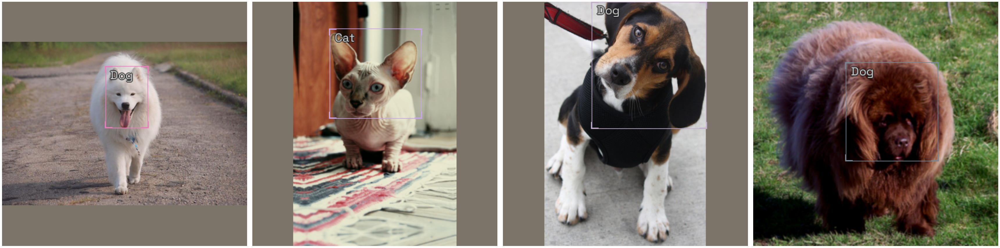

In [20]:
img_list = [train_ds[i] for i in range(4)]
show_samples(img_list, ncols=4)

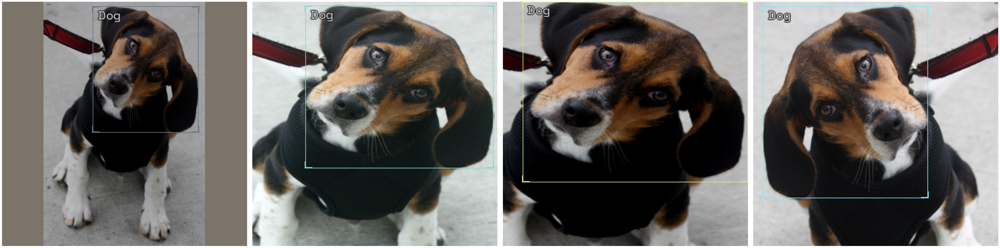

In [22]:
img_variations = [train_ds[2] for _ in range(4)]
show_samples(img_variations, ncols=4)

In [24]:
parser.class_map

<ClassMap: {'background': 0, 'cat': 1, 'dog': 2}>

## Select a model

In [23]:
model_type = models.torchvision.retinanet
backbone = model_type.backbones.resnet50_fpn

In [25]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), 
                         num_classes=len(parser.class_map))

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

## Create Dataloaders

In [27]:
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


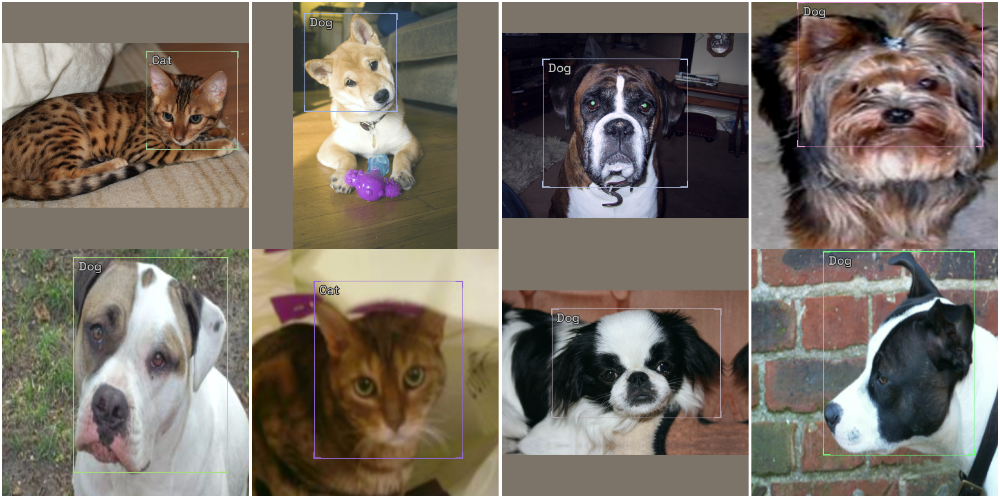

In [28]:
model_type.show_batch(first(train_dl), ncols=4)

## Metrics

In [29]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

## Learner

In [30]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], 
                                  model=model, 
                                  metrics=metrics)

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


SuggestedLRs(valley=0.00013182566908653826)

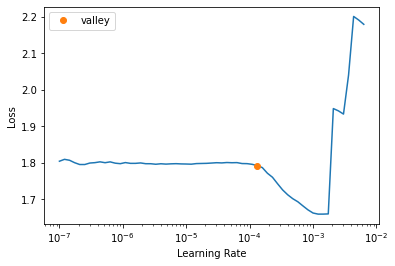

In [31]:
learn.lr_find()

In [32]:
learn.fine_tune(10, 1e-4, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.907765,0.838694,0.123283,04:46
1,0.684156,0.658019,0.308893,04:28


epoch,train_loss,valid_loss,COCOMetric,time
0,0.469473,0.464461,0.510882,06:52
1,0.405250,0.376780,0.621463,06:48
2,0.358496,0.375286,0.569084,06:50
3,0.312706,0.292832,0.679302,06:49


epoch,train_loss,valid_loss,COCOMetric,time
0,0.469473,0.464461,0.510882,06:52
1,0.405250,0.376780,0.621463,06:48
2,0.358496,0.375286,0.569084,06:50
3,0.312706,0.292832,0.679302,06:49
4,0.282725,0.259806,0.695540,06:49
5,0.258638,0.240849,0.717883,06:48
6,0.236181,0.222001,0.753084,06:48
7,0.226300,0.220850,0.734866,06:48
8,0.218355,0.208607,0.752588,06:48
9,0.211004,0.212226,0.746259,06:48


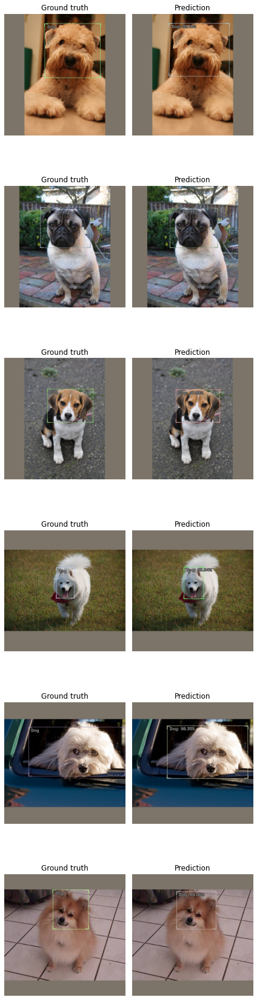

In [34]:
model_type.show_results(model, valid_ds, detection_threshold=0.5)

## Predictions on Inference Dataset

In [35]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
predictions = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/185 [00:00<?, ?it/s]

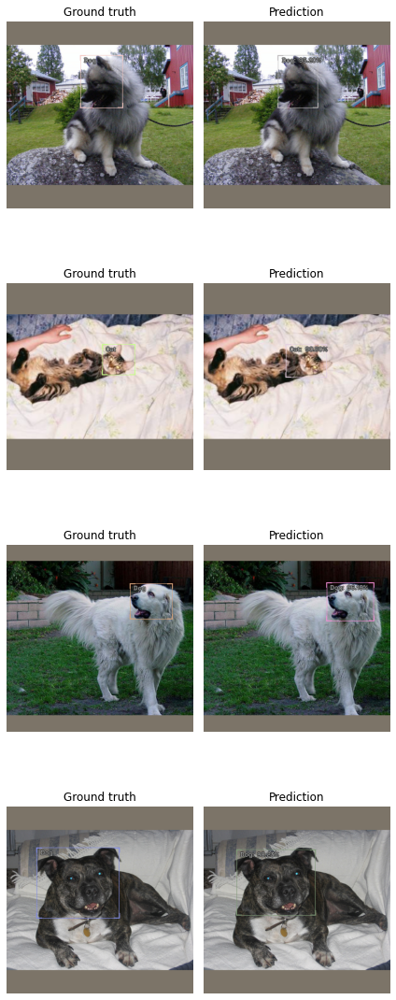

In [36]:
show_preds(preds=predictions[:4])